In [5]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import scanpy as sc
import numpy as np
import pandas as pd
import anndata as ad
from scipy import sparse

In [4]:
# import cell2location

In [ ]:
samples_dict = {"Immature": "A0021_043", "0hr": "A0008_041", "1hr": "A0021_044", "4hr": "A0008_045", "4hr_replicate": "A0021_042", "6hr": "A0021_045", "8hr": "A0008_044", "8hr_replicate": "A0021_038", "11hr": "A0008_046", "12hr": "A0021_046"}

In [ ]:
sc.settings.verbosity = 3  
# verbosity: errors (0), warnings (1), info (2), hints (3)
sc.settings.set_figure_params(dpi=80, facecolor='white', frameon=True, figsize=(5, 5))

In [ ]:
ovary_raw = pd.read_csv("./../scRNAseq_references/Ovary_subset_0_count_data.csv", index_col=0, header = 0, delimiter=",")
print(ovary_raw.shape)
ovary_meta_data = pd.read_csv("./../scRNAseq_references/Ovary_subset_0_meta_data.csv", index_col = 0)
print(ovary_meta_data.shape)


In [ ]:
var_df = pd.DataFrame(ovary_raw.index.to_frame())
var_df.columns = ["gene"]

In [ ]:
ovary_adata_sc = ad.AnnData(X=sparse.csr_matrix(ovary_raw.transpose().to_numpy()), obs=ovary_meta_data, var=var_df)
ovary_adata_sc

In [ ]:
# ovary_adata_sc.write_h5ad("./../pyobjs/ovary_adata_sc.h5ad")


In [ ]:
ovary_adata_sc = sc.read_h5ad("./../pyobjs/ovary_adata_sc.h5ad")
ovary_adata_sc

In [ ]:
# sc.pp.normalize_total(ovary_adata_sc, inplace=True)
# sc.pp.log1p(ovary_adata_sc)
# sc.pp.highly_variable_genes(ovary_adata_sc, max_mean=3, min_disp=0.20)
# sc.pl.highly_variable_genes(ovary_adata_sc)
# ovary_adata_sc.raw = ovary_adata_sc
# ovary_adata_sc = ovary_adata_sc[:, ovary_adata_sc.var.highly_variable]
# print(ovary_adata_sc.shape)
# sc.pp.regress_out(ovary_adata_sc, ["total_counts"])
# sc.pp.scale(ovary_adata_sc, max_value=10)
# sc.pp.pca(ovary_adata_sc, random_state= 0)
# sc.pl.pca_variance_ratio(ovary_adata_sc, n_pcs = 50)
# sc.pp.neighbors(ovary_adata_sc, n_pcs=20)
# sc.tl.umap(ovary_adata_sc)
# sc.tl.leiden(ovary_adata_sc, key_added="leiden_1.0", resolution = 1.0)
# sc.tl.leiden(ovary_adata_sc, key_added="leiden_1.2", resolution = 1.2)

In [ ]:
from cell2location.utils.filtering import filter_genes
selected = filter_genes(ovary_adata_sc, cell_count_cutoff=5, cell_percentage_cutoff2=0.03, nonz_mean_cutoff=1.12)
# %notebook filter the object
ovary_adata_sc = ovary_adata_sc[:, selected].copy()

In [ ]:
ovary_adata_sc.obs.columns

In [ ]:
ovary_adata_sc.obs["mouse"].value_counts()

In [ ]:
# prepare anndata for the regression model
cell2location.models.RegressionModel.setup_anndata(adata=ovary_adata_sc,
                        # 10X reaction / sample / batch
                        batch_key='mouse',
                        # cell type, covariate used for constructing signatures
                        labels_key='Level0')

In [ ]:
from cell2location.models import RegressionModel
mod = RegressionModel(ovary_adata_sc)

# view anndata_setup as a sanity check
mod.view_anndata_setup()

In [ ]:
mod.train(max_epochs=250, use_gpu=2)

In [ ]:
mod.plot_history(20)

In [ ]:
# In this section, we export the estimated cell abundance (summary of the posterior distribution).
ovary_adata_sc = mod.export_posterior(
    ovary_adata_sc, sample_kwargs={'num_samples': 1000, 'batch_size': 2500, 'use_gpu': True}
)

# Save model
mod.save("./../pyobjs/ovary_cell2location_sc_ref_mod_level0", overwrite=True)

# Save anndata object with results
ovary_adata_sc.write("./../pyobjs/ovary_cell2location_sc_ref_level0.h5ad")

In [4]:
adata_ref = sc.read_h5ad("./../../../pyobjs/ovary_cell2location_sc_ref_level0.h5ad")
mod = cell2location.models.RegressionModel.load(f"./../../../pyobjs/ovary_cell2location_sc_ref_mod_level0", adata_ref, use_gpu = True)

NameError: name 'cell2location' is not defined

In [6]:
# adata_ref = ovary_adata_sc

In [8]:
# export estimated expression in each cluster
if 'means_per_cluster_mu_fg' in adata_ref.varm.keys():
    inf_aver = adata_ref.varm['means_per_cluster_mu_fg'][[f'means_per_cluster_mu_fg_{i}'
                                    for i in adata_ref.uns['mod']['factor_names']]].copy()
else:
    inf_aver = adata_ref.var[[f'means_per_cluster_mu_fg_{i}'
                                    for i in adata_ref.uns['mod']['factor_names']]].copy()
inf_aver.columns = adata_ref.uns['mod']['factor_names']
print(inf_aver.shape)
inf_aver.iloc[0:5, 0:5]

(12484, 6)


,Endothelium,Epithelium,Granulosa,Immune,Mesenchyme
X0610007P14Rik,0.105726,0.178022,0.172366,0.082479,0.111672
X0610009B22Rik,0.090050,0.176439,0.155735,0.053973,0.106185
X0610009E02Rik,0.000958,0.006714,0.003160,0.001402,0.001917
X0610009O20Rik,0.035517,0.015716,0.035125,0.012007,0.029953
X0610010F05Rik,0.045287,0.016684,0.061386,0.022403,0.027245


In [9]:
adata_vis = sc.read_h5ad("./../pyobjs/adata_ovary_combined_raw_counts_filtered.h5ad")
adata_vis = adata_vis[sc.read_h5ad("./../pyobjs/adata_ovary_combined_processed0.h5ad").obs_names]
adata_vis

View of AnnData object with n_obs × n_vars = 158309 × 31053
    obs: 'barcode', 'x', 'y', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'n_counts', 'Sample'
    var: 'gene_ids', 'feature_types', 'mt', 'n_cells_by_counts-0hr', 'mean_counts-0hr', 'pct_dropout_by_counts-0hr', 'total_counts-0hr', 'n_cells_by_counts-11hr', 'mean_counts-11hr', 'pct_dropout_by_counts-11hr', 'total_counts-11hr', 'n_cells_by_counts-12hr', 'mean_counts-12hr', 'pct_dropout_by_counts-12hr', 'total_counts-12hr', 'n_cells_by_counts-1hr', 'mean_counts-1hr', 'pct_dropout_by_counts-1hr', 'total_counts-1hr', 'n_cells_by_counts-4hr', 'mean_counts-4hr', 'pct_dropout_by_counts-4hr', 'total_counts-4hr', 'n_cells_by_counts-4hr_replicate', 'mean_counts-4hr_replicate', 'pct_dropout_by_counts-4hr_replicate', 'total_counts-4hr_replicate', 'n_cells_by_counts-6hr', 'mean_counts-6hr', 'pct_dropout_by_counts-6hr', 'total_counts-6hr', 'n_cells_by_counts-8hr', 'mean_counts-8hr', 'pct_dropout_by_counts-8hr', 

In [10]:
# find shared genes and subset both anndata and reference signatures
intersect = np.intersect1d(adata_vis.var_names, inf_aver.index)
print(len(intersect))
adata_vis = adata_vis[:, intersect].copy()
inf_aver = inf_aver.loc[intersect, :].copy()

# prepare anndata for cell2location model
cell2location.models.Cell2location.setup_anndata(adata=adata_vis, batch_key="Sample")

11822


In [11]:
# create and train the model
mod = cell2location.models.Cell2location(
    adata_vis, cell_state_df=inf_aver,
    # the expected average cell abundance: tissue-dependent
    # hyper-prior which can be estimated from paired histology:
    N_cells_per_location=1,
    # hyperparameter controlling normalisation of
    # within-experiment variation in RNA detection:
    detection_alpha=20
)
mod.view_anndata_setup()

Anndata setup with scvi-tools version 0.20.0.

Setup via `Cell2location.setup_anndata` with arguments:

{
│   'layer': None,
│   'batch_key': 'Sample',
│   'labels_key': None,
│   'categorical_covariate_keys': None,
│   'continuous_covariate_keys': None
}

         Summary Statistics          
┏━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━┓
┃     Summary Stat Key     ┃ Value  ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━┩
│         n_batch          │   10   │
│         n_cells          │ 158309 │
│ n_extra_categorical_covs │   0    │
│ n_extra_continuous_covs  │   0    │
│         n_labels         │   1    │
│          n_vars          │ 11822  │
└──────────────────────────┴────────┘

               Data Registry                
┏━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Registry Key ┃    scvi-tools Location    ┃
┡━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│      X       │          adata.X          │
│    batch     │ adata.obs['_scvi_batch']  │
│    ind_x     │   adata.obs['_indices']   │
│    labels    │ adata.obs['_scvi_labels'] │
└──────────────┴───────────────────────────┘

                    batch State Registry                     
┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━┓
┃   Source Location   ┃  Categories   ┃ scvi-tools Encoding ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━┩
│ adata.obs['Sample'] │   Immature    │          0          │
│                     │      0hr      │          1          │
│                     │      1hr      │          2          │
│                     │      4hr      │          3          │
│                     │ 4hr_replicate │          4          │
│                     │      6hr      │          5          │
│                     │      8hr      │          6          │
│                     │ 8hr_replicate │          7          │
│                     │     11hr      │          8          │
│                     │     12hr      │          9          │
└─────────────────────┴───────────────┴─────────────────────┘

                     labels State Registry                      
┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━┓
┃      Source Location      ┃ Categories ┃ scvi-tools Encoding ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━┩
│ adata.obs['_scvi_labels'] │     0      │          0          │
└───────────────────────────┴────────────┴─────────────────────┘

In [12]:
mod.train(max_epochs=5000,
          # train using full data (batch_size=None)
          batch_size=5000,
          # use all data points in training because
          # we need to estimate cell abundance at all locations
          train_size= 1.0,
          use_gpu=2)

/home/mm2937/miniconda3/envs/python397/lib/python3.9/site-packages/lightning_fabric/plugins/environments/slurm.py:166: PossibleUserWarning: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python3.9 /home/mm2937/.local/lib/python3.9/site-packages/i ...
  rank_zero_warn(
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
/home/mm2937/miniconda3/envs/python397/lib/python3.9/site-packages/lightning_fabric/plugins/environments/slurm.py:166: PossibleUserWarning: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python3.9 /home/mm2937/.local/lib/python3.9/site-packages/i ...
  rank_zero_warn(
/home/mm2937/miniconda3/envs/python397/lib/python3.9/site-pa

Epoch 5000/5000: 100%|██████████| 5000/5000 [15:35:07<00:00, 11.14s/it, v_num=1, elbo_train=3.3e+8]   

`Trainer.fit` stopped: `max_epochs=5000` reached.


Epoch 5000/5000: 100%|██████████| 5000/5000 [15:35:07<00:00, 11.22s/it, v_num=1, elbo_train=3.3e+8]


The history saving thread hit an unexpected error (OperationalError('attempt to write a readonly database')).History will not be written to the database.


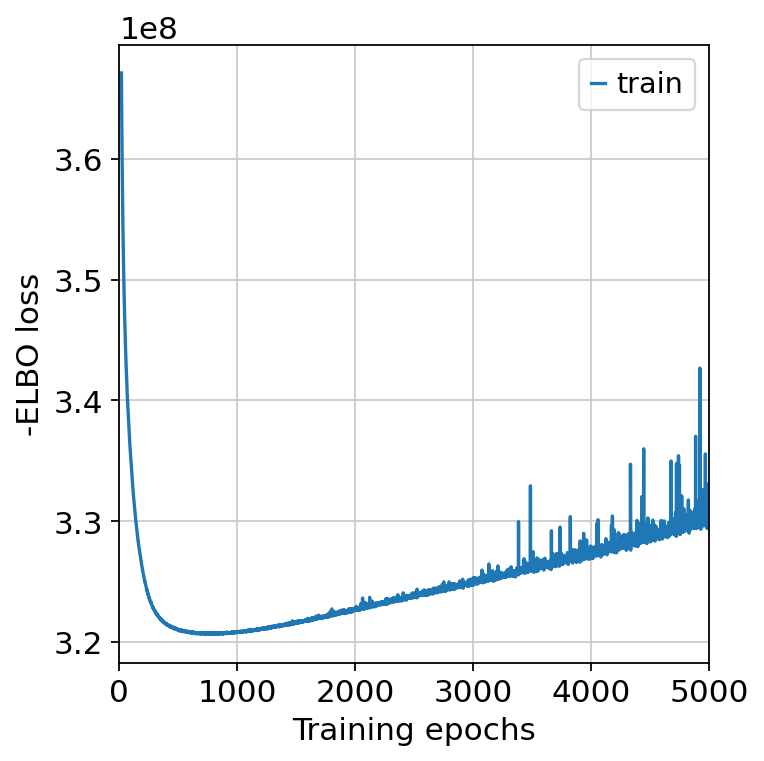

In [13]:
mod.plot_history(20)

In [14]:
# Save model
mod.save("./../pyobjs/ovary_cell2location_ss_combined_mod_level0", overwrite=True)

# In this section, we export the estimated cell abundance (summary of the posterior distribution).
adata_vis = mod.export_posterior(
    adata_vis, sample_kwargs={'num_samples': 500, 'batch_size': 5000, 'use_gpu': True}
)

# Save anndata object with results
adata_vis.write("./../pyobjs/ovary_cell2location_ss_combined_level0.h5ad")

Sampling global variables, sample: 100%|██████████| 499/499 [00:08<00:00, 56.94it/s]


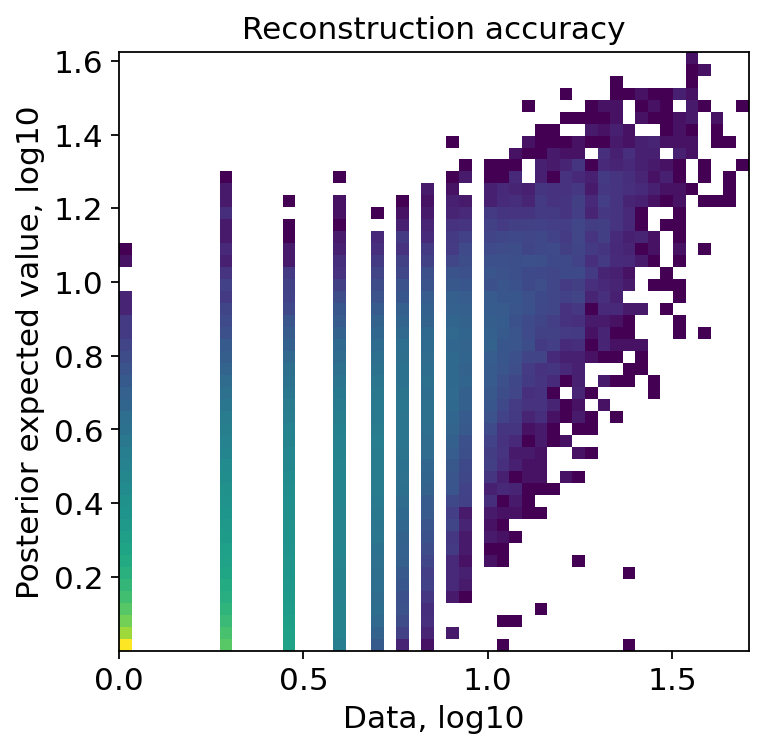

In [15]:
mod.plot_QC()

In [31]:
# adata_vis = sc.read_h5ad("./../pyobjs/ovary_cell2location_ss_combined_level0.h5ad")
# adata_vis
# mod = cell2location.models.Cell2location.load(f"./../pyobjs/ovary_cell2location_ss_combined_mod_level0", adata_vis, )

In [16]:
print(adata_vis.obsm)
adata_vis.obsm['q05_cell_proportions'] = adata_vis.obsm['q05_cell_abundance_w_sf'].div(adata_vis.obsm['q05_cell_abundance_w_sf'].sum(axis=1), axis=0)
# add 5% quantile, representing confident cell abundance, 'at least this amount is present',
# to adata.obs with nice names for plotting
adata_vis.obs["total_abundance"] = adata_vis.obsm['q05_cell_abundance_w_sf'].sum(axis = 1)
adata_vis.obs[adata_vis.uns['mod']['factor_names']] = adata_vis.obsm['q05_cell_proportions']
ct_list = list(adata_vis.uns['mod']['factor_names'])
ct_list = ["Level0_" + x for x in ct_list]
# for ct in ct_list:
#     data = adata_vis.obs[ct].values
#     adata_vis.obs[ct] = np.clip(data,0, np.quantile(data, 0.90))
adata_vis.obs["Level0_" + "max_pred"] = adata_vis.obs[adata_vis.uns['mod']['factor_names']].max(axis=1)
adata_vis.obs["Level0_" + "max_pred_celltype"] = adata_vis.obs[adata_vis.uns['mod']['factor_names']].idxmax(axis=1)

AxisArrays with keys: spatial, means_cell_abundance_w_sf, stds_cell_abundance_w_sf, q05_cell_abundance_w_sf, q95_cell_abundance_w_sf


In [17]:
adata_vis

AnnData object with n_obs × n_vars = 158309 × 11822
    obs: 'barcode', 'x', 'y', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'n_counts', 'Sample', '_indices', '_scvi_batch', '_scvi_labels', 'total_abundance', 'Endothelium', 'Epithelium', 'Granulosa', 'Immune', 'Mesenchyme', 'Oocyte', 'Level0_max_pred', 'Level0_max_pred_celltype'
    var: 'gene_ids', 'feature_types', 'mt', 'n_cells_by_counts-0hr', 'mean_counts-0hr', 'pct_dropout_by_counts-0hr', 'total_counts-0hr', 'n_cells_by_counts-11hr', 'mean_counts-11hr', 'pct_dropout_by_counts-11hr', 'total_counts-11hr', 'n_cells_by_counts-12hr', 'mean_counts-12hr', 'pct_dropout_by_counts-12hr', 'total_counts-12hr', 'n_cells_by_counts-1hr', 'mean_counts-1hr', 'pct_dropout_by_counts-1hr', 'total_counts-1hr', 'n_cells_by_counts-4hr', 'mean_counts-4hr', 'pct_dropout_by_counts-4hr', 'total_counts-4hr', 'n_cells_by_counts-4hr_replicate', 'mean_counts-4hr_replicate', 'pct_dropout_by_counts-4hr_replicate', 'total_counts-4hr_r

/home/mm2937/.local/lib/python3.9/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


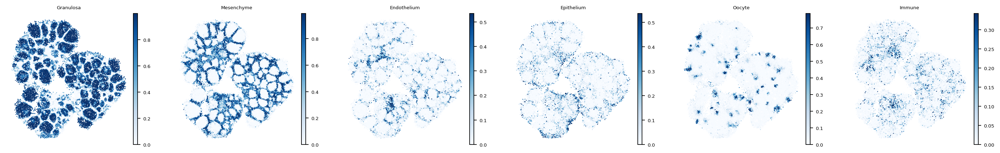

/home/mm2937/.local/lib/python3.9/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


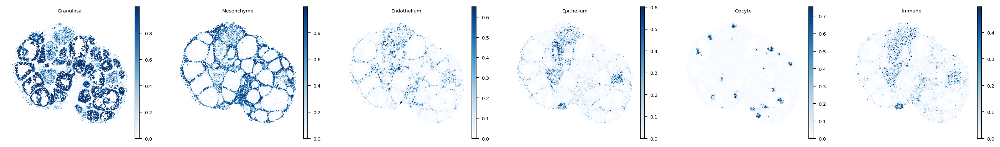

/home/mm2937/.local/lib/python3.9/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


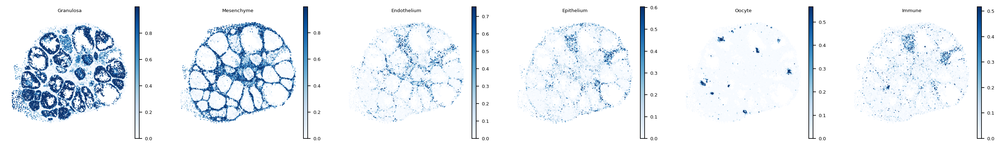

/home/mm2937/.local/lib/python3.9/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


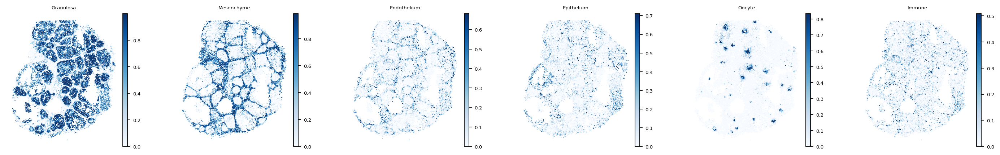

/home/mm2937/.local/lib/python3.9/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


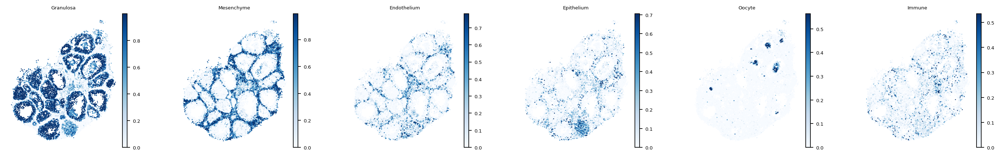

/home/mm2937/.local/lib/python3.9/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


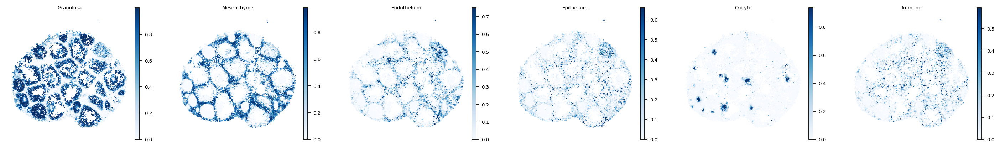

/home/mm2937/.local/lib/python3.9/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


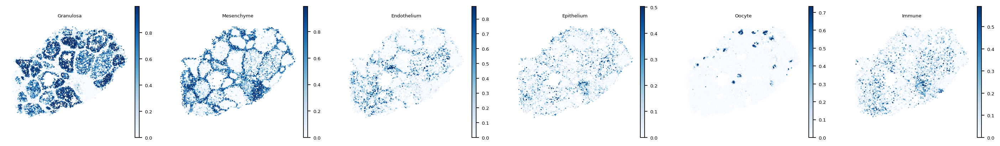

/home/mm2937/.local/lib/python3.9/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


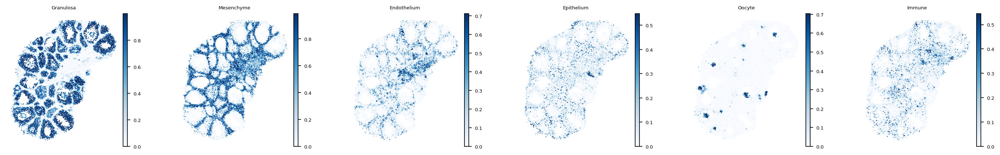

/home/mm2937/.local/lib/python3.9/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


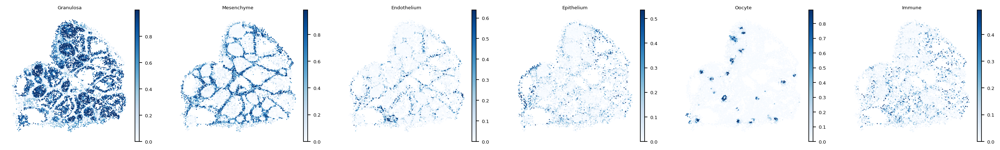

/home/mm2937/.local/lib/python3.9/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


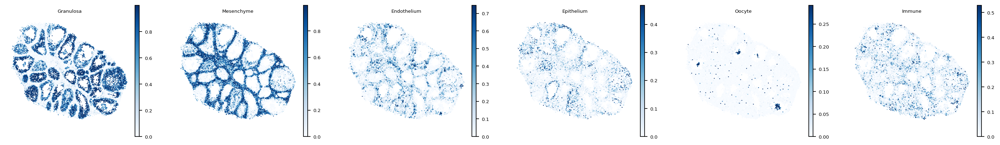

In [18]:
# plot in spatial coordinates
sc.settings.set_figure_params(dpi_save= 400, fontsize=6, figsize=(3.0, 3.0), facecolor='white', frameon=False, transparent=True, vector_friendly = True, format="pdf")
for sample in samples_dict.keys():    
    sc.pl.spatial(adata_vis[adata_vis.obs["Sample"] == sample], cmap="Blues",
                      # show first 8 cell types
                      color=list(adata_vis.obs["Level0_max_pred_celltype"].value_counts().index), spot_size= 30, 
                  ncols=6, wspace = 0.2, hspace=0.2,
                      # limit color scale at 99.2% quantile of cell abundance
                     vmin=0, vmax='p99.2', legend_fontsize=5)

In [19]:
# Compute expected expression per cell type
expected_dict = mod.module.model.compute_expected_per_cell_type(
    mod.samples["post_sample_q05"], mod.adata_manager
)

# Add to anndata layers
for i, n in enumerate(mod.factor_names_):
    adata_vis.layers["Level0_" + n] = expected_dict['mu'][i]

In [20]:
adata_vis

AnnData object with n_obs × n_vars = 158309 × 11822
    obs: 'barcode', 'x', 'y', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'n_counts', 'Sample', '_indices', '_scvi_batch', '_scvi_labels', 'total_abundance', 'Endothelium', 'Epithelium', 'Granulosa', 'Immune', 'Mesenchyme', 'Oocyte', 'Level0_max_pred', 'Level0_max_pred_celltype'
    var: 'gene_ids', 'feature_types', 'mt', 'n_cells_by_counts-0hr', 'mean_counts-0hr', 'pct_dropout_by_counts-0hr', 'total_counts-0hr', 'n_cells_by_counts-11hr', 'mean_counts-11hr', 'pct_dropout_by_counts-11hr', 'total_counts-11hr', 'n_cells_by_counts-12hr', 'mean_counts-12hr', 'pct_dropout_by_counts-12hr', 'total_counts-12hr', 'n_cells_by_counts-1hr', 'mean_counts-1hr', 'pct_dropout_by_counts-1hr', 'total_counts-1hr', 'n_cells_by_counts-4hr', 'mean_counts-4hr', 'pct_dropout_by_counts-4hr', 'total_counts-4hr', 'n_cells_by_counts-4hr_replicate', 'mean_counts-4hr_replicate', 'pct_dropout_by_counts-4hr_replicate', 'total_counts-4hr_r

In [21]:
# Save anndata object with results
adata_vis.write_h5ad("./../pyobjs/slideseq_cell2loc_RCTD_level0.h5ad")

In [ ]:
adata_vis = sc.read_h5ad("./../pyobjs/slideseq_cell2loc_RCTD_level0.h5ad")
sc.pp.normalize_total(adata_vis, inplace=True)
# sc.pp.log1p(adata_vis)
adata_vis

In [ ]:
# samples_dict.pop("4hr")
adata_vis = adata_vis[adata_vis.obs["Sample"].isin(list(samples_dict.keys())),]

In [ ]:
fig, axs = plt.subplots(2,5, figsize = (20,8))
for i, sample in enumerate(samples_dict.keys()):
    sc.settings.set_figure_params(dpi=200, dpi_save= 300, fontsize=10, facecolor='white', frameon=False, figsize=(2.0, 2.0), vector_friendly = False, transparent=True, format="pdf")
    sc.pl.spatial(adata_vis[adata_vis.obs["Sample"] == sample], color = ["Level0_max_pred_celltype"], wspace= 0.5, spot_size = 30, frameon=False, title=sample, show=False, ax=axs[int(i/4), int(i%4)])  

In [ ]:
adata_vis

In [ ]:
adata_vis.X = adata_vis.layers["Level0_Oocyte"]
# sc.pp.normalize_total(adata_vis, inplace=True)
# sc.pp.log1p(adata_vis)

In [ ]:
np.max(adata_vis.X)

In [ ]:
sc.settings.set_figure_params(dpi=80, figsize=(3.5, 3.0))
fig, ax = plt.subplots(1,1,figsize = (2.5,2))
sc.pl.scatter(adata_vis[adata_vis.obs["Level0_max_pred_celltype"].isin(["Granulosa", "Mesenchyme"]),], x = "Inha", y = "Acta2", color="Level0_max_pred_celltype", size=50, ax = ax, show=False)
plt.xlim([-0.5, 4])
plt.ylim([-0.5, 4])
plt.show()

In [ ]:
sc.settings.set_figure_params(dpi=80, figsize=(3.5, 3.0))
fig, ax = plt.subplots(1,1,figsize = (2.5,2))
sc.pl.scatter(adata_vis[adata_vis.obs["Level0_max_pred_celltype"].isin(["Granulosa", "Oocyte"]),], x = "Inha", y = "H1foo", color="Level0_max_pred_celltype", size=50, ax = ax, show=False)
plt.xlim([-0.5, 4.0])
plt.ylim([-0.5, 4.0])
plt.show()

In [ ]:
sc.pl.highest_expr_genes(adata_vis[adata_vis.obs["Level0_max_pred_celltype"].isin(["Oocyte"]),])